<a href="https://colab.research.google.com/github/fabrisio-ponte/DNN_Stock_Model_Forecasting/blob/main/Reinforcement_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

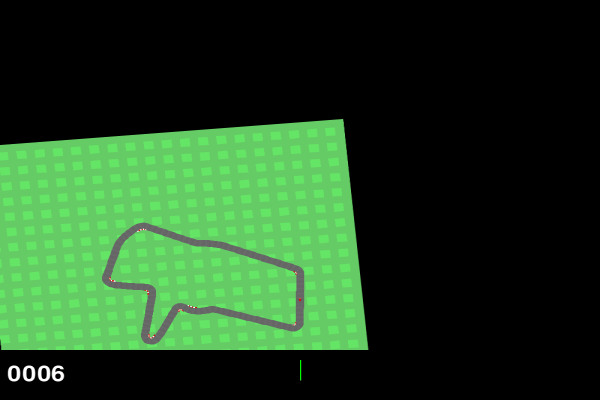

In [4]:
# 📦 Install dependencies
!pip install gymnasium[box2d] moviepy -q

# 🏎️ Import libraries
import gymnasium as gym
import numpy as np
import imageio
import os
from IPython.display import Image

# 🎮 Create CarRacing environment
env = gym.make("CarRacing-v3", render_mode="rgb_array")

# 🎥 Record frames
frames = []
obs, info = env.reset()
done = False

for _ in range(300):  # ~10 seconds of driving
    frames.append(env.render())
    action = env.action_space.sample()  # Random movement
    obs, reward, terminated, truncated, info = env.step(action)
    if terminated or truncated:
        break

env.close()

# 💾 Save as GIF
os.makedirs("video", exist_ok=True)
imageio.mimsave("video/carracing.gif", frames, fps=30)

# 📸 Show GIF
Image(open("video/carracing.gif", 'rb').read())


Using cpu device
Wrapping the env in a VecTransposeImage.
-----------------------------
| time/              |      |
|    fps             | 60   |
|    iterations      | 1    |
|    time_elapsed    | 33   |
|    total_timesteps | 2048 |
-----------------------------
-----------------------------------------
| time/                   |             |
|    fps                  | 37          |
|    iterations           | 2           |
|    time_elapsed         | 109         |
|    total_timesteps      | 4096        |
| train/                  |             |
|    approx_kl            | 0.005983896 |
|    clip_fraction        | 0.056       |
|    clip_range           | 0.2         |
|    entropy_loss         | -4.26       |
|    explained_variance   | 0.000538    |
|    learning_rate        | 0.0003      |
|    loss                 | 0.225       |
|    n_updates            | 10          |
|    policy_gradient_loss | -0.00455    |
|    std                  | 1           |
|    value_loss   

/usr/local/lib/python3.11/dist-packages/moviepy/config_defaults.py:1: DeprecationWarning: invalid escape sequence '\P'
  """


Moviepy - Building video /content/videos/ppo-car-step-0-to-step-500.mp4.
Moviepy - Writing video /content/videos/ppo-car-step-0-to-step-500.mp4



/usr/local/lib/python3.11/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: DeprecationWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
  from scipy.ndimage.filters import sobel

  if event.key is 'enter':



Moviepy - Done !
Moviepy - video ready /content/videos/ppo-car-step-0-to-step-500.mp4
MoviePy - Building file ppo_car.gif with imageio.


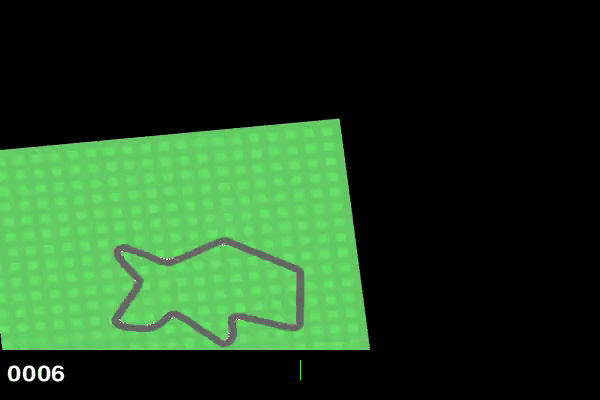

In [6]:
# 🚀 Install dependencies
!pip install gymnasium[box2d] stable-baselines3[extra] moviepy -q

# 🧠 Import required modules
import gymnasium as gym
from stable_baselines3 import PPO
from stable_baselines3.common.vec_env import DummyVecEnv, VecVideoRecorder
import os

# 🎮 Create and wrap the environment
env_id = "CarRacing-v3"
video_folder = "./videos/"
os.makedirs(video_folder, exist_ok=True)

def make_env():
    return gym.make(env_id, render_mode="rgb_array")

env = DummyVecEnv([make_env])

# 🧠 Initialize the PPO agent
model = PPO("CnnPolicy", env, verbose=1)

# 🏋️ Train the agent
model.learn(total_timesteps=100_000)  # You can go higher, but this is a decent start

# 🎥 Record a video of the trained agent
env = VecVideoRecorder(env, video_folder, record_video_trigger=lambda x: x == 0,
                       video_length=500, name_prefix="ppo-car")

obs = env.reset()
for _ in range(500):
    action, _ = model.predict(obs)
    obs, _, done, _ = env.step(action)

env.close()

# 🔁 Convert video to GIF
import imageio
import glob
import numpy as np
from IPython.display import Image

mp4_path = sorted(glob.glob(video_folder + "*.mp4"))[-1]
gif_path = "ppo_car.gif"

# Convert MP4 to GIF
import moviepy.editor as mpy
clip = mpy.VideoFileClip(mp4_path)
clip.write_gif(gif_path)

# 📸 Display the GIF
Image(open(gif_path,'rb').read())
